# Filtros digitais

Neste notebook usamos os conceitos das aulas anteriores para uma introdução aos filtros FIR. 

Temos dois tipos principais de filtros digitais:

- Filtros IIR (Infinite Impulse Response - vistos na aula passada)
- Filtros FIR (Finite Impulse Response)

# Filtros FIR

Neste notebook vamos explorar o projeto de Filtros FIR (Finite Impulse Response). Neste caso, a resposta ao impulso do filtro é um sinal de duração finita. Isso implica que a RDC da $H(z)$ é todo o plano $z$ (exceto por um polo em $z=0$). 

A Transformada Z geral de um filtro IIR é dada por:

\begin{equation}
H(z) = \sum\limits_{i=0}^{P}b_i z^{-i}
\tag{1}
\end{equation}

Podemos pensar na relação entre os sinais de entrada e saída. Tenha em mente que você pode usar o filtro para processar um sinal em tempo real. Assim, a Eq. (1) se torna


\begin{equation}
\frac{Y(z)}{X(z)} = \sum\limits_{i=0}^{N}b_i z^{-i}
\end{equation}

\begin{equation}
Y(z) = b_0 X(z) + b_1 z^{-1} X(z) + b_2 z^{-2} X(z) + ... + b_N z^{-N} X(z)
\tag{2}
\end{equation}

e se lembrarmos que a TZ de $\delta[n-m]$ é $z^{-m}$, a TZ inversa da Eq. (2) é
    
\begin{equation}
y[n] = b_0 x[n] + b_1 x[n-1] + b_2 x[n-2] + ... + b_N x[n-N]
\end{equation}    

o que implica que o estado atual da saída, $y[n]$, é computado com base no estado atual e passado do sinal de entrada.


Nós podemos ver a Eq. (3) como operações vetoriais:

- $\textbf{x}_n = \left\{x[n] \ x[n-1] \ x[n-2] \ ... \ x[n-P] \right\}$
- $\textbf{b} = \left\{b_0 \ b_1 \ b_2 \ ... \ b_P \right\}$
- $\textbf{y}_n = \left\{y[n-1] \ y[n-2] \ ... \ y[n-Q] \right\}$
- $\textbf{a} = \left\{a_1 \ a_2 \ ... \ a_P \right\}$

\begin{equation}
y[n] = \textbf{b} \ \textbf{x}_{n}^{T}
\tag{4}
\end{equation}

A grande vantagem dos filtros ***FIR*** é sua flexibilidade para imitar diferentes respostas em frequência. A grande desvantagem é seu ***custo computacional*** elevado, quando comparados aos filtros ***FIR***. Isso implica que para implementar uma dada FRF, o número de coeficientes dos filtros ***FIR*** é relativamente alto.


In [1]:
# importar as bibliotecas necessárias
import numpy as np # arrays
import matplotlib.pyplot as plt # plots
plt.rcParams.update({'font.size': 14})
import IPython.display as ipd # to play signals
import sounddevice as sd
import soundfile as sf
# Os próximos módulos são usados pra criar nosso SLIT
#from scipy.signal import butter, lfilter, freqs, tf2sos, sosfilt
from scipy import signal

# Importar um sinal para filtragem

- https://freesound.org/people/augustoschwartz/sounds/251255/

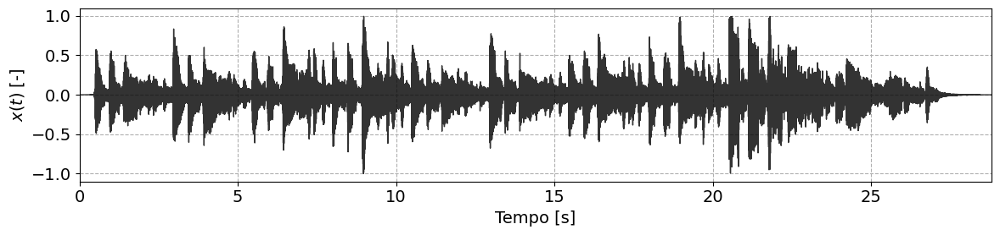

In [3]:
##### x(t) music signal #################
xn, fs = sf.read('miguilim.wav')
xn = xn[:,0] # only one channel
time_xn = np.linspace(0, (len(xn)-1)/fs, len(xn))

plt.figure(figsize=(12,3))
plt.plot(time_xn, xn, '-k', linewidth = 1, alpha = 0.8)
plt.grid(linestyle = '--', which='both')
plt.xlabel('Tempo [s]')
plt.ylabel(r'$x(t)$ [-]')
plt.xlim((0, time_xn[-1]))
plt.tight_layout()
plt.show()

ipd.Audio(xn, rate=fs) # load a NumPy array

# MSE (Mean Square Eror) - Ex 1

- Criar um filtro aproximadamente ideal
- Sintetizar o filtro FIR a partir da minimização do erro médio quadrático

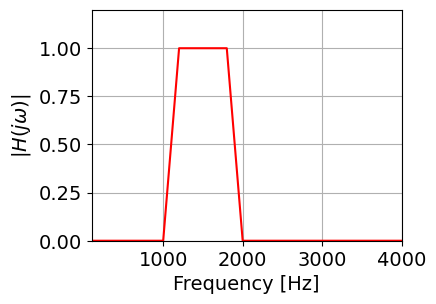

In [5]:
bands = np.arange(0, 24000, 200)
desired = np.ones(len(bands))
desired[bands <= 1000] = 0
desired[bands >= 2000] = 0

fig = plt.figure(figsize=(4,3))
ax = fig.add_subplot(1, 1, 1)
ax.plot(bands, desired, color = 'r')
ax.set_xlabel('Frequency [Hz]')
ax.set_ylabel(r'$|H(j \omega)|$')
ax.axis((100, 4000, 0, 1.20))
ax.grid(which='both', axis='both')

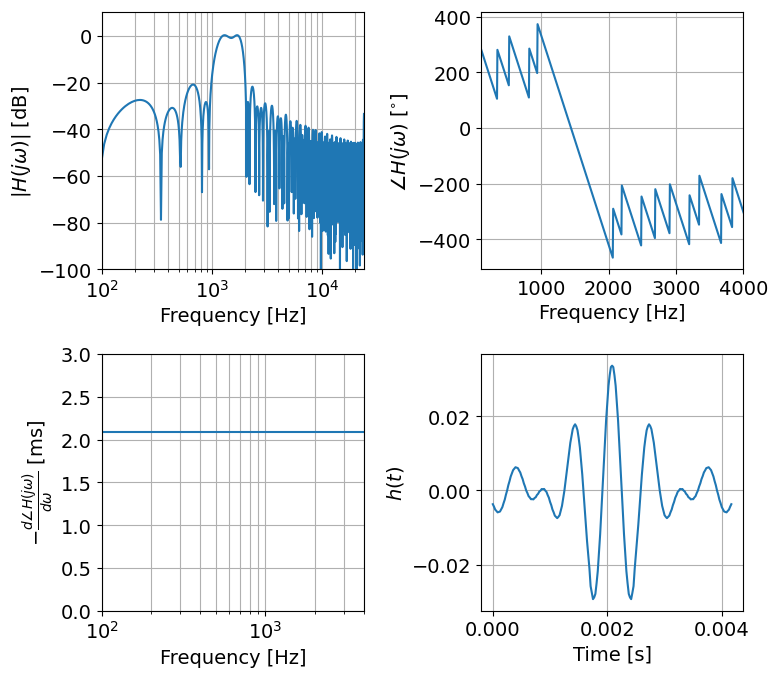

In [7]:
numtaps = 201
b_f = signal.firls(numtaps, bands, desired, fs=fs)
sos_f = signal.tf2sos(b_f, 1, pairing='nearest')
# zeros, poles and gain
z_f, p_f, k_f = signal.sos2zpk(sos_f)

# Transfer function
freq_f, H_f = signal.sosfreqz(sos_f, 4100, fs=fs)
freq_f, H_f = signal.freqz(b_f, 1, 4100, fs=fs)

# Group delay
freqg_f, gd_f = signal.group_delay((b_f, 1), 512, fs=fs);

fig = plt.figure(figsize=(8,7))
ax = fig.add_subplot(2, 2, 1)
ax.semilogx(freq_f, 20 * np.log10(np.maximum(abs(H_f), 1e-5)))
ax.set_xlabel('Frequency [Hz]')
ax.set_ylabel(r'$|H(j \omega)|$ [dB]')
ax.axis((100, fs/2, -100, 10))
ax.grid(which='both', axis='both')

ax = fig.add_subplot(2, 2, 2)
ax.plot(freq_f, np.rad2deg(np.unwrap(np.angle(H_f))))
ax.set_xlabel('Frequency [Hz]')
ax.set_ylabel(r'$\angle H(j \omega)$ [$^{\circ}$]')
ax.set_xlim((100, 4000))
ax.grid(which='both', axis='both')

ax = fig.add_subplot(2, 2, 3)
ax.semilogx(freqg_f, 1000*gd_f/fs)
ax.set_xlabel('Frequency [Hz]')
ax.set_ylabel(r'$-\frac{d\angle H(j \omega)}{d \omega}$ [ms]')
ax.set_xlim((100, 4000))
ax.set_ylim((0, 3))
ax.grid(which='both', axis='both')

ax = fig.add_subplot(2, 2, 4)
ax.plot(np.linspace(0, (len(b_f)-1)/fs, len(b_f)), b_f)
ax.set_xlabel('Time [s]')
ax.set_ylabel(r'$h(t)$')
ax.grid(which='both', axis='both')
plt.tight_layout()
plt.show()

In [9]:
len(b_f)

201

# Vamos filtrar o sinal com o scipy

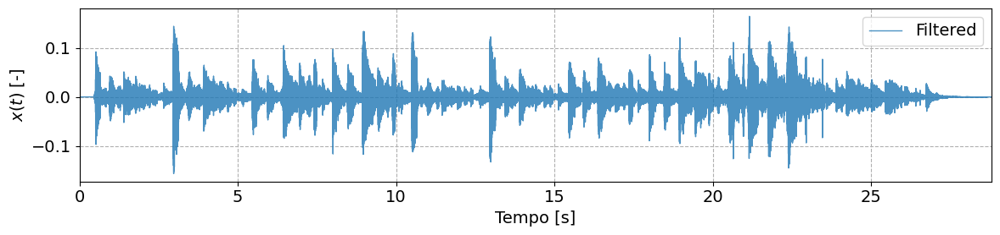

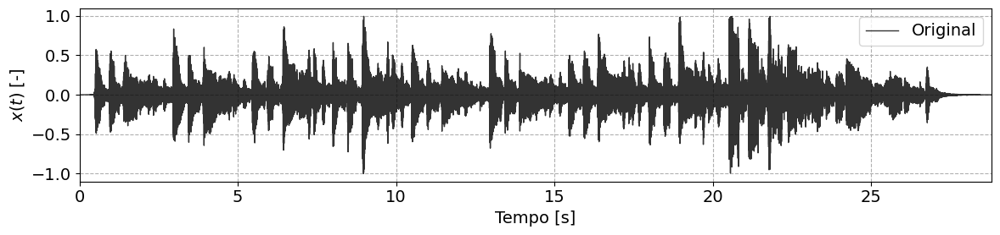

In [11]:
# filter using sos
xn_filtered = signal.sosfilt(sos_f, xn)

# plot
plt.figure(figsize=(12,3))
plt.plot(time_xn, xn_filtered, linewidth = 1, alpha = 0.8, label = 'Filtered')
plt.legend(loc = 'upper right')
plt.grid(linestyle = '--', which='both')
plt.xlabel('Tempo [s]')
plt.ylabel(r'$x(t)$ [-]')
plt.xlim((0, time_xn[-1]))
plt.tight_layout()

plt.figure(figsize=(12,3))
plt.plot(time_xn, xn, '-k', linewidth = 1, alpha = 0.8, label = 'Original')
plt.legend(loc = 'upper right')
plt.grid(linestyle = '--', which='both')
plt.xlabel('Tempo [s]')
plt.ylabel(r'$x(t)$ [-]')
plt.xlim((0, time_xn[-1]))
plt.tight_layout()


ipd.Audio(xn_filtered, rate=fs) # load a NumPy array

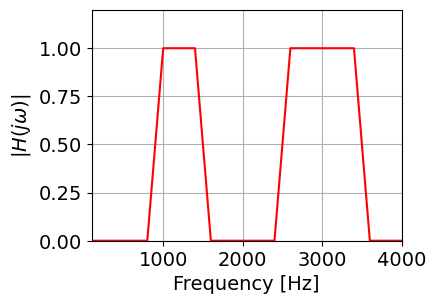

In [13]:
bands = np.arange(0, 24000, 200)
desired = np.ones(len(bands))
desired[bands <= 800] = 0
desired[bands >= 1600] = 0
desired[bands >= 2500] = 1
desired[bands >= 3500] = 0

fig = plt.figure(figsize=(4,3))
ax = fig.add_subplot(1, 1, 1)
ax.plot(bands, desired, color = 'r')
ax.set_xlabel('Frequency [Hz]')
ax.set_ylabel(r'$|H(j \omega)|$')
ax.axis((100, 4000, 0, 1.20))
ax.grid(which='both', axis='both')

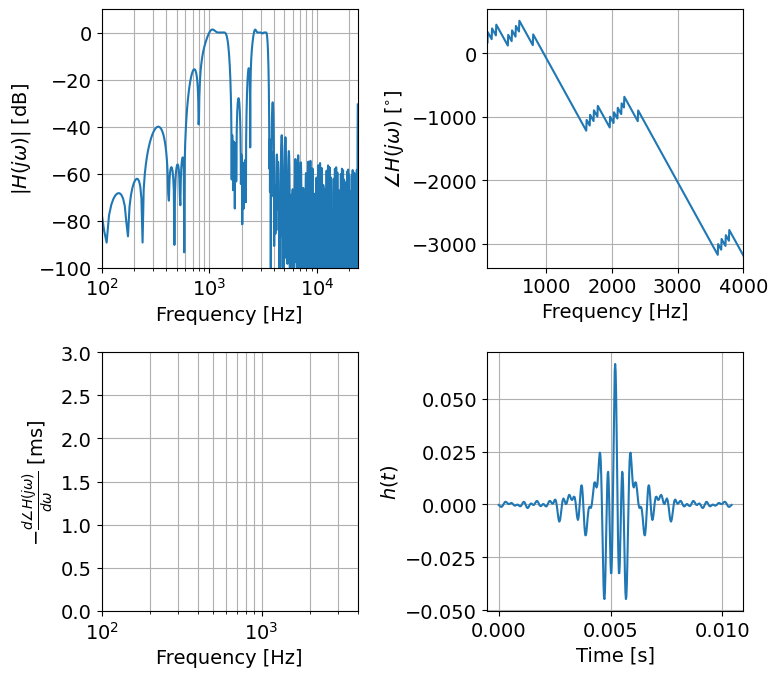

In [33]:
numtaps = 501
b_f = signal.firls(numtaps, bands, desired, fs=fs)
sos_f = signal.tf2sos(b_f, 1, pairing='nearest')
# zeros, poles and gain
z_f, p_f, k_f = signal.sos2zpk(sos_f)

# Transfer function
freq_f, H_f = signal.sosfreqz(sos_f, 4100, fs=fs)
freq_f, H_f = signal.freqz(b_f, 1, 4100, fs=fs)

# Group delay
freqg_f, gd_f = signal.group_delay((b_f, 1), 512, fs=fs);

fig = plt.figure(figsize=(8,7))
ax = fig.add_subplot(2, 2, 1)
ax.semilogx(freq_f, 20 * np.log10(np.maximum(abs(H_f), 1e-5)))
ax.set_xlabel('Frequency [Hz]')
ax.set_ylabel(r'$|H(j \omega)|$ [dB]')
ax.axis((100, fs/2, -100, 10))
ax.grid(which='both', axis='both')

ax = fig.add_subplot(2, 2, 2)
ax.plot(freq_f, np.rad2deg(np.unwrap(np.angle(H_f))))
ax.set_xlabel('Frequency [Hz]')
ax.set_ylabel(r'$\angle H(j \omega)$ [$^{\circ}$]')
ax.set_xlim((100, 4000))
ax.grid(which='both', axis='both')

ax = fig.add_subplot(2, 2, 3)
ax.semilogx(freqg_f, 1000*gd_f/fs)
ax.set_xlabel('Frequency [Hz]')
ax.set_ylabel(r'$-\frac{d\angle H(j \omega)}{d \omega}$ [ms]')
ax.set_xlim((100, 4000))
ax.set_ylim((0, 3))
ax.grid(which='both', axis='both')

ax = fig.add_subplot(2, 2, 4)
ax.plot(np.linspace(0, (len(b_f)-1)/fs, len(b_f)), b_f)
ax.set_xlabel('Time [s]')
ax.set_ylabel(r'$h(t)$')
ax.grid(which='both', axis='both')
plt.tight_layout()
plt.show()

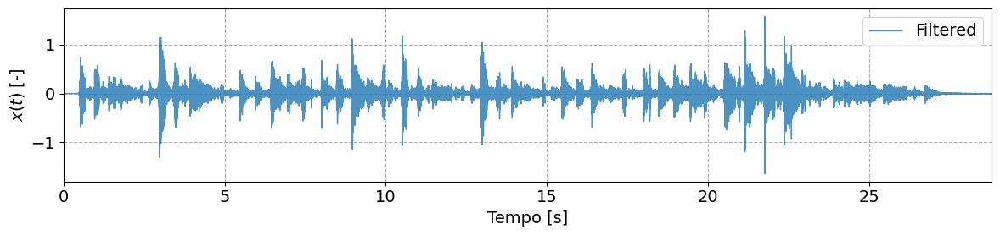

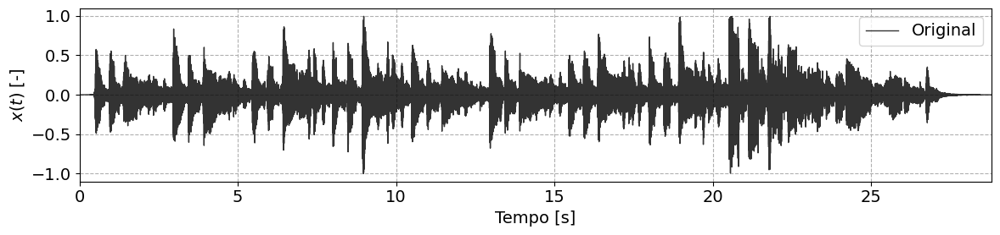

In [35]:
# filter using sos
xn_filtered = signal.sosfilt(sos_f, xn)

# plot
plt.figure(figsize=(12,3))
plt.plot(time_xn, xn_filtered, linewidth = 1, alpha = 0.8, label = 'Filtered')
plt.legend(loc = 'upper right')
plt.grid(linestyle = '--', which='both')
plt.xlabel('Tempo [s]')
plt.ylabel(r'$x(t)$ [-]')
plt.xlim((0, time_xn[-1]))
plt.tight_layout()

plt.figure(figsize=(12,3))
plt.plot(time_xn, xn, '-k', linewidth = 1, alpha = 0.8, label = 'Original')
plt.legend(loc = 'upper right')
plt.grid(linestyle = '--', which='both')
plt.xlabel('Tempo [s]')
plt.ylabel(r'$x(t)$ [-]')
plt.xlim((0, time_xn[-1]))
plt.tight_layout()


ipd.Audio(xn_filtered, rate=fs) # load a NumPy array

# Filtrar com uma função

Aqui podemos usar

\begin{equation}
y[n] = \textbf{b} \ \textbf{x}_{n}^{T}
\tag{4}
\end{equation}

para enxergar que a filtragem digital é simplesmente uma operação matemática

In [19]:
from tqdm import trange, tqdm

def our_filter(xn, b):
    """ Filter using Eq. (4)
    
    Parameters
    -------------
    xn : numpy 1darray
        The input signal
    b : numpy 1darray
        filter numerator coefficients
    """
    # lenght of xn
    N = len(xn)
    # order
    od = len(b)
    # initialize yn
    yn = np.zeros(N)
    # loop
    bar = tqdm(total = N, desc = 'Filtering...')
    for jn in np.arange(od, N-od):
        x_slice = np.flip(xn[jn-od:jn])
        #print(x_slice.shape)
        yn[jn] = np.dot(b, x_slice)
        bar.update(1)
    bar.close()
    gain = np.std(xn)/np.std(yn)
    #yn = (len(xn)/44100)*xn
    return yn
    

Filtering...: 100%|█████████▉| 1381381/1382383 [00:02<00:00, 497656.23it/s]


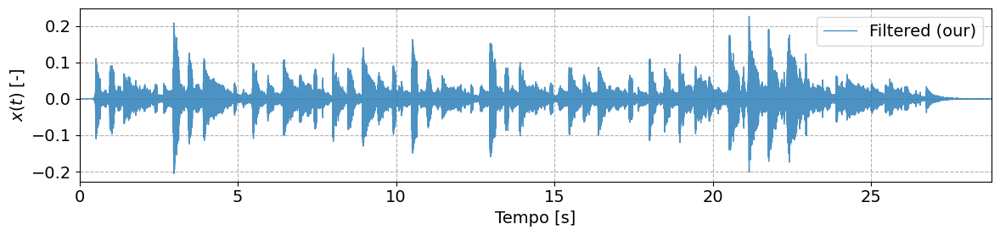

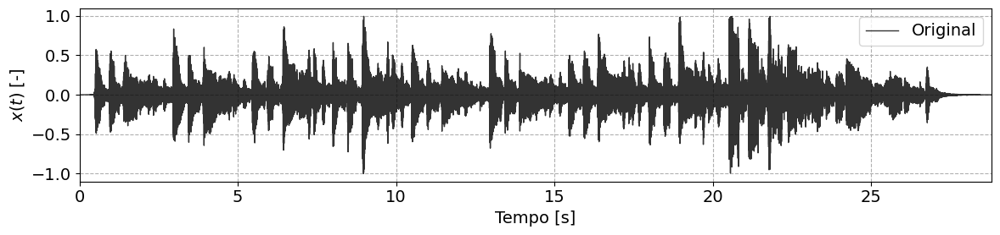

In [37]:
# Filter
yn = our_filter(xn, b_f)

# plot
plt.figure(figsize=(12,3))
plt.plot(time_xn, yn, linewidth = 1, alpha = 0.8, label = 'Filtered (our)')
plt.legend(loc = 'upper right')
plt.grid(linestyle = '--', which='both')
plt.xlabel('Tempo [s]')
plt.ylabel(r'$x(t)$ [-]')
plt.xlim((0, time_xn[-1]))
#plt.ylim((-40, 40))
plt.tight_layout()

plt.figure(figsize=(12,3))
plt.plot(time_xn, xn, '-k', linewidth = 1, alpha = 0.8, label = 'Original')
plt.legend(loc = 'upper right')
plt.grid(linestyle = '--', which='both')
plt.xlabel('Tempo [s]')
plt.ylabel(r'$x(t)$ [-]')
plt.xlim((0, time_xn[-1]))
plt.tight_layout()

ipd.Audio(yn, rate=fs) # load a NumPy array